In [1]:
%pylab inline
from TB.c import *

from ms_mint.notebook import Mint

from ms_mint.plotly_tools import plot_peak_shapes

import colorlover as cl
import pandas as pd
import plotly_express as px

import plotly.graph_objects as go

from collections.abc import Iterable
from os.path import basename
from plotly.subplots import make_subplots
from ms_mint.plotly_tools import plot_peak_shapes, plot_peak_shapes_3d, plot_heatmap

Populating the interactive namespace from numpy and matplotlib
import pandas as pd
import numpy as np
import os, re

from os.path import isdir, isfile, basename, dirname

from glob import glob
from pathlib import Path as P
from tqdm.notebook import tqdm

import seaborn as sns



In [2]:
import plotly
plotly.__version__

'4.9.0'

In [3]:
mint = Mint()

results_file = '../tests/data/demo_results.xlsx'

mint.load(results_file)

HTML(value='<style>textarea, input { font-family: monospace; }</style>')

HTML(value='<style>.container { width:90% !important; }</style>')

HTML(value='<style>textarea, input { font-family: monospace; }</style>')

HTML(value='<style>.container { width:90% !important; }</style>')

W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\CA\CA_B1.mzXML)
W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\CA\CA_B2.mzXML)
W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\CA\CA_B3.mzXML)
W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\CA\CA_B4.mzXML)
W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\EC\EC_B1.mzXML)
W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\EC\EC_B2.mzXML)
W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\EC\EC_B3.mzXML)
W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\EC\EC_B4.mzXML)
W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\SA\SA_B1.mzXML)
W File not found (C:\Users\soere\data\metabolomics_storage\MINT\MINT_demofiles\SA\SA_B2.mzXML)
W File not found (C:\Users\soere\data\metabolomics

In [4]:
mint.results.ms_file = mint.results.ms_file.apply(lambda x: x.split('\\')[-1])

# Test Heatmap

In [5]:
fig_params = dict(scale=2,  width=600, height=600)

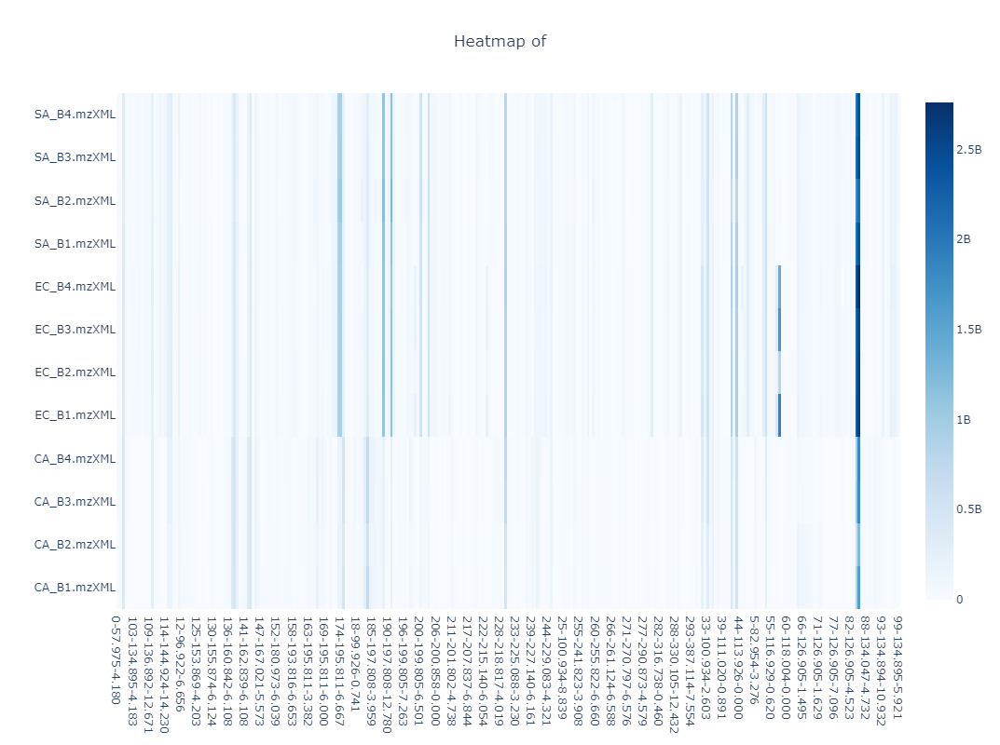

In [6]:
fig = plot_heatmap(mint.crosstab().T)
fig.write_image("../docs/image/1-heatmap.png", **fig_params)
fig

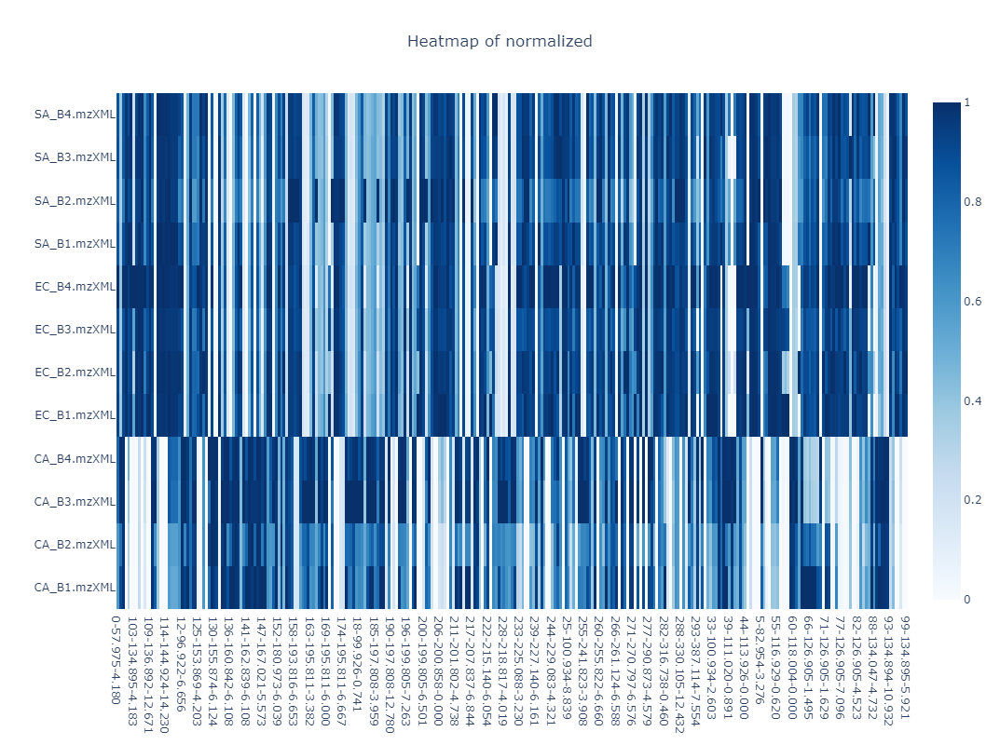

In [7]:
fig = plot_heatmap(mint.crosstab().T, normed_by_cols=True)
fig.write_image("../docs/image/2-heatmap_normed.png", **fig_params)
fig

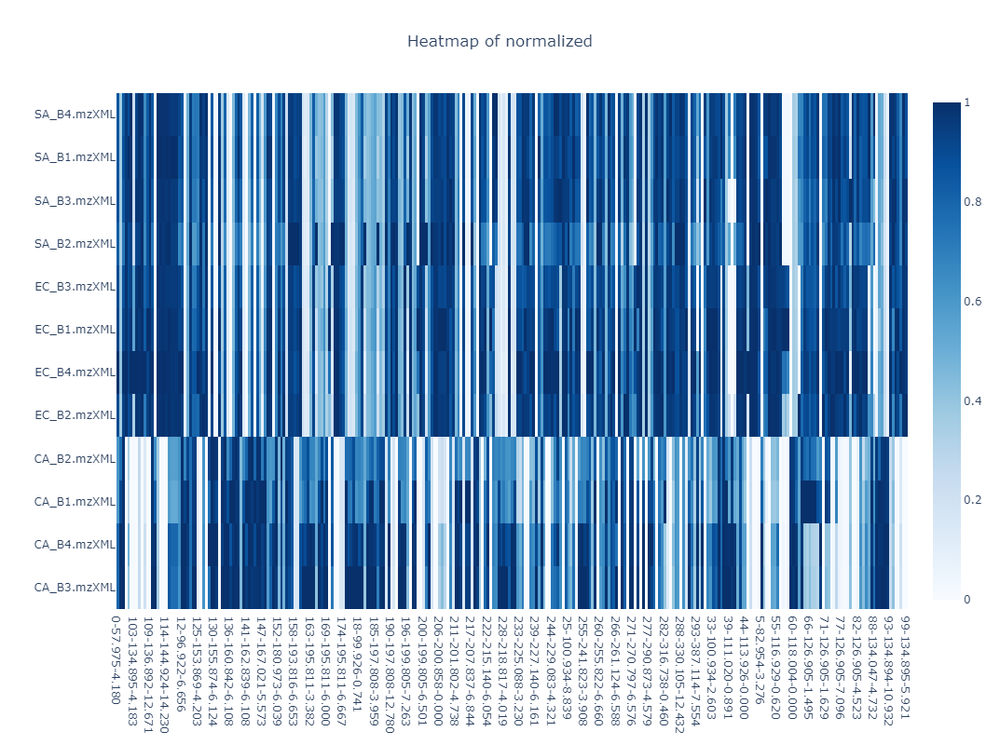

In [8]:
fig = plot_heatmap(mint.crosstab().T, normed_by_cols=True, clustered=True)
fig.write_image("../docs/image/3-heatmap_normed_clust.png", **fig_params)
fig

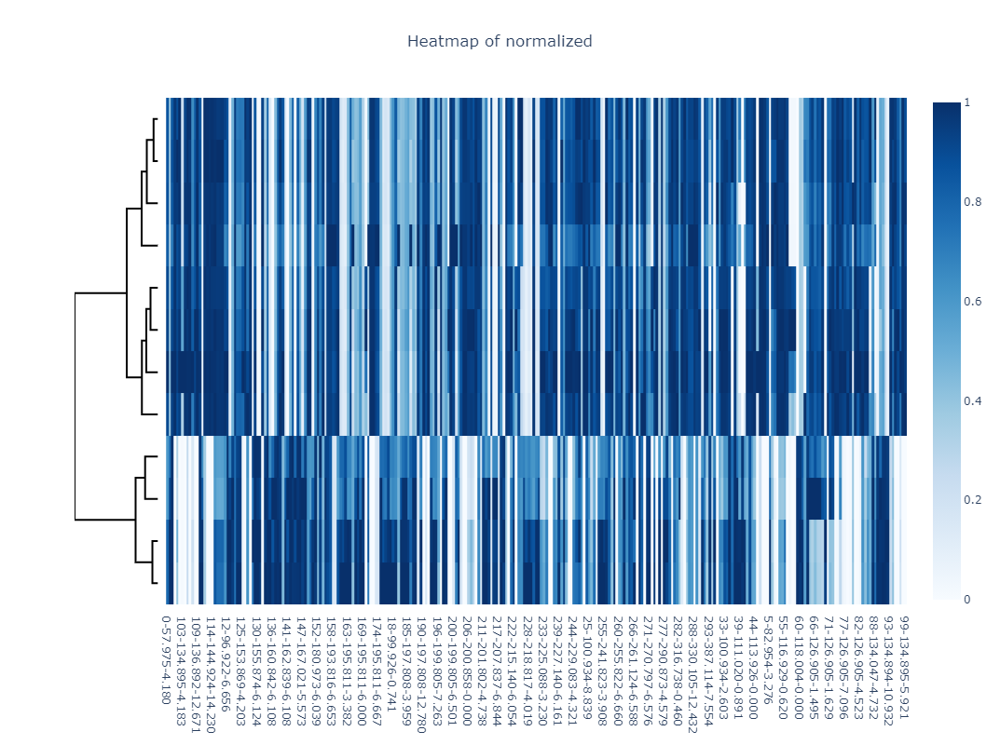

In [9]:
fig = plot_heatmap(mint.crosstab().T, normed_by_cols=True, clustered=True, add_dendrogram=True)
fig.write_image("../docs/image/4-heatmap_normed_clust_dendr.png", **fig_params)
fig

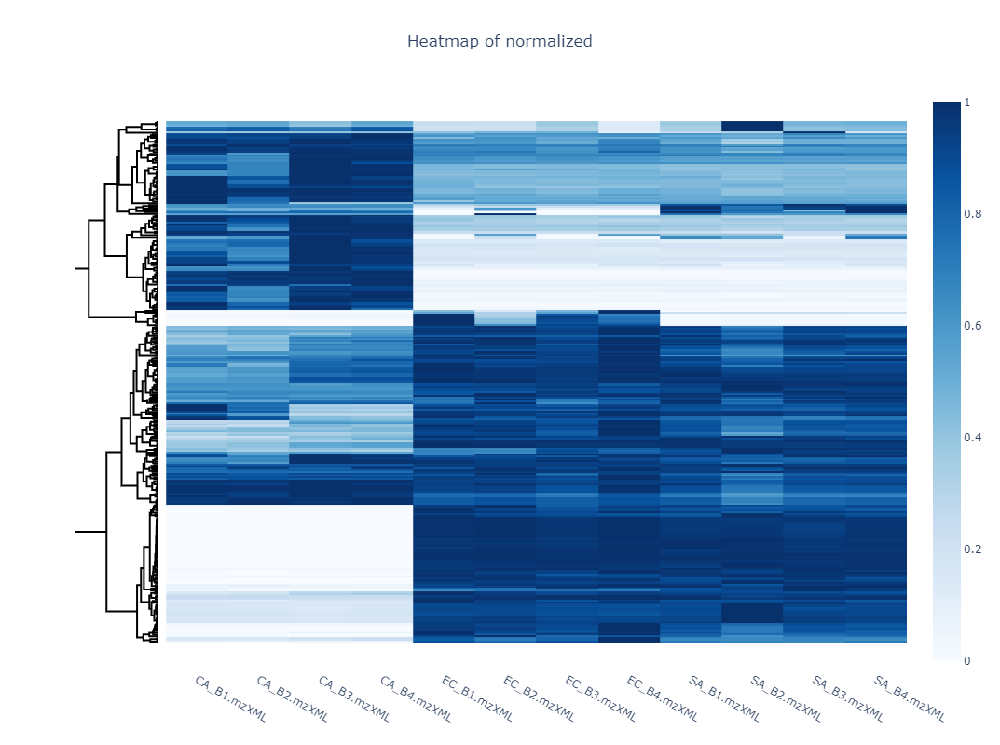

In [10]:
fig = plot_heatmap(mint.crosstab().T, normed_by_cols=True, clustered=True, 
                   add_dendrogram=True, transposed=True)
fig.write_image("../docs/image/5-heatmap_normed_clust_dendr_transp.png", **fig_params)
fig

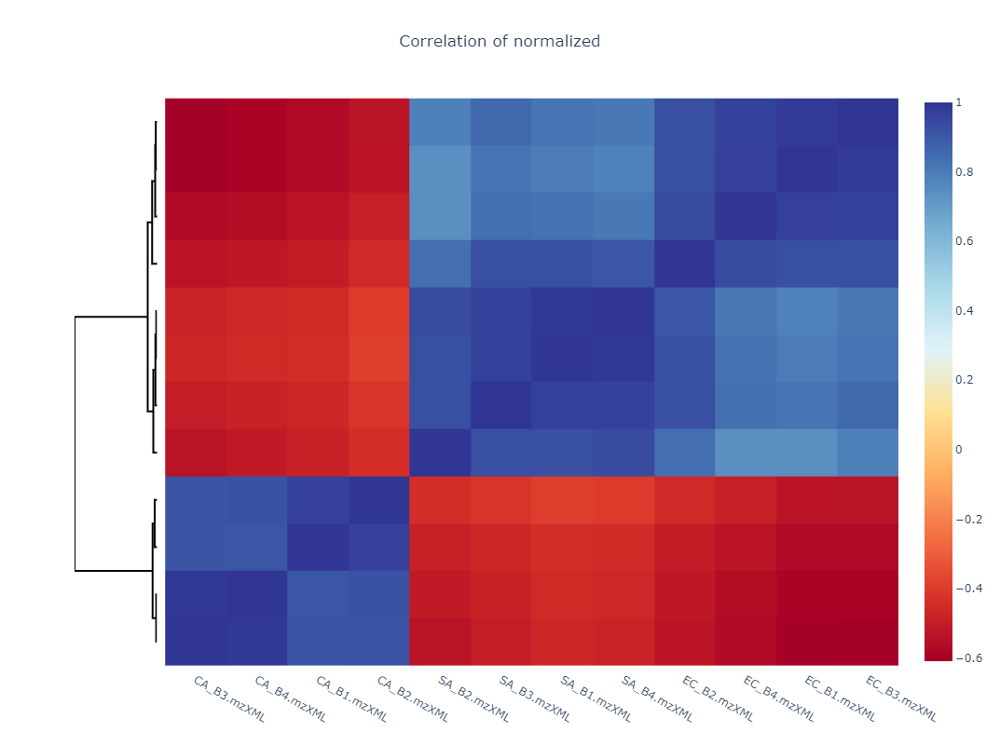

In [11]:
fig = plot_heatmap(mint.crosstab().T, normed_by_cols=True, clustered=True, 
                   add_dendrogram=True, transposed=True, correlation=True)
fig.write_image("../docs/image/6-heatmap_normed_clust_dendr_transp_corr.png", **fig_params)
fig

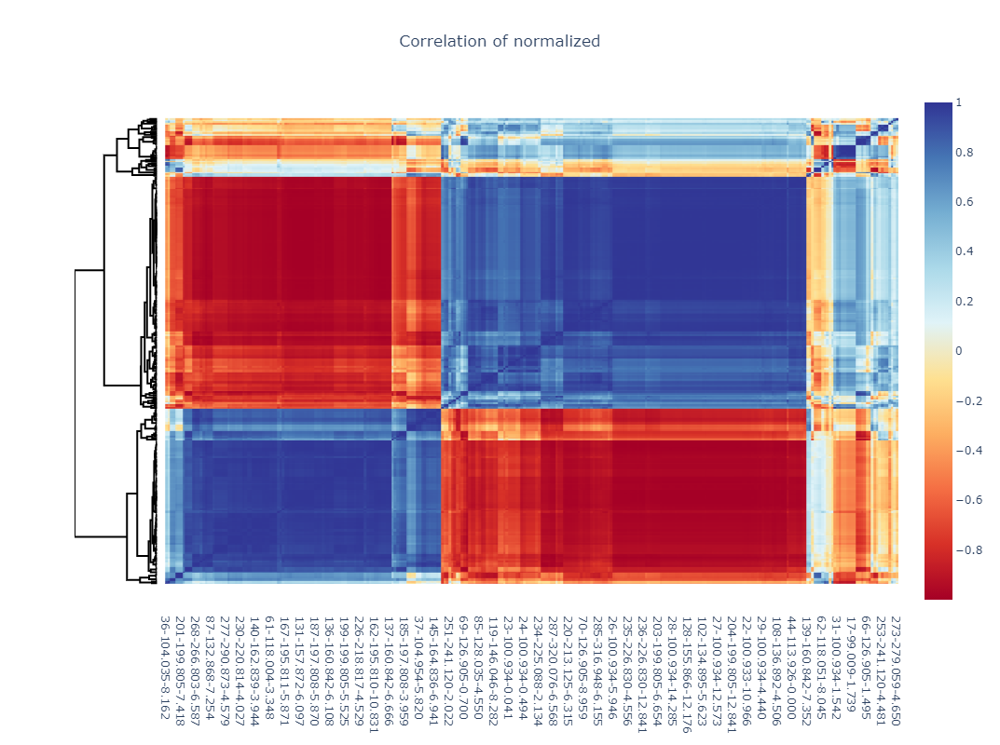

In [12]:
fig = plot_heatmap(mint.crosstab().T, normed_by_cols=True, clustered=True, 
                   add_dendrogram=True, transposed=False, correlation=True)
fig.write_image("../docs/image/7-heatmap_normed_clust_dendr_corr.png", **fig_params)
fig

# Peak Shapes

In [13]:
labels = mint.crosstab().mean(axis=1).sort_values(ascending=False).head(6).index.to_list()

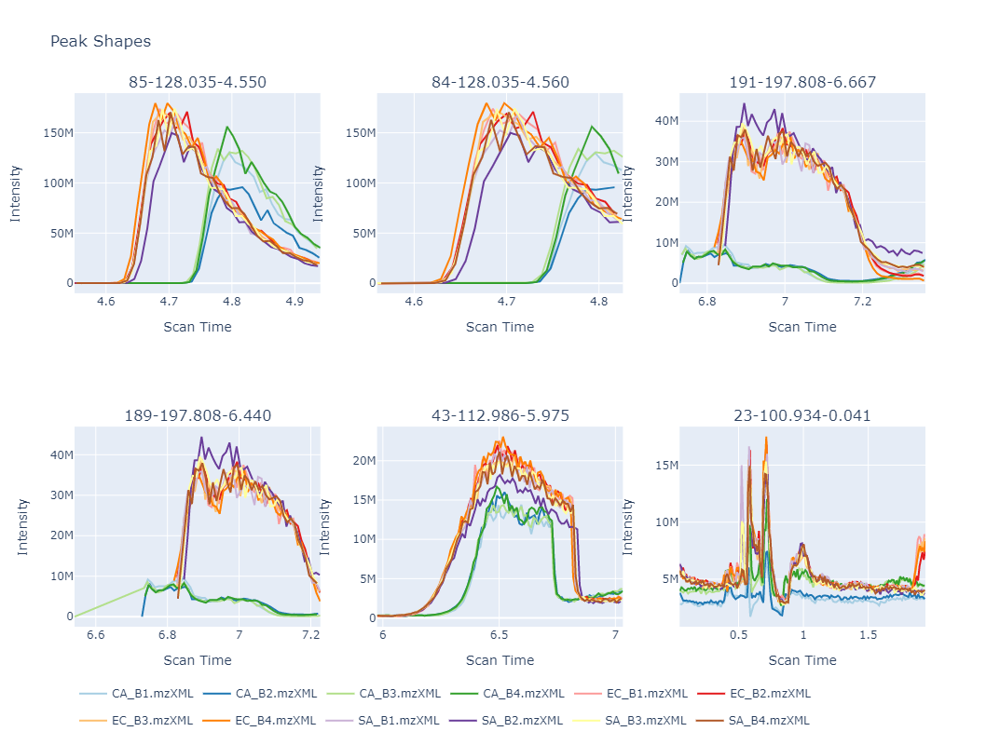

In [14]:
fig = plot_peak_shapes(mint.results, biomarkers=labels, legend_orientation='h')
fig.write_image("../docs/image/peak_shapes.png", scale=2, width=1500, height=900)
fig

In [15]:
from ms_mint.vis.peak_properties import plot_peak_properties

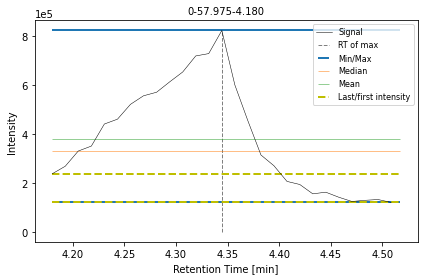

In [16]:
plot_peak_properties( mint.results.iloc[0] )
savefig('../docs/peak_properties.png', dpi=300)

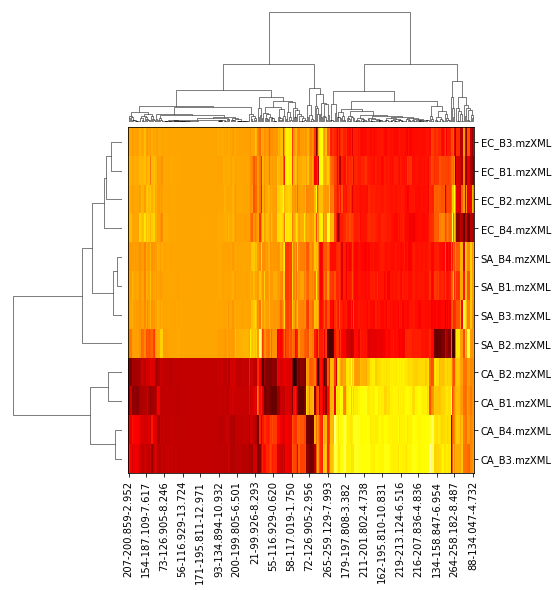

In [18]:
mint.plot_clustering()
savefig('../docs/clustering.png', dpi=300)